# 1. Текстовое описание набора данных 
Рак молочной железы Висконсин (диагностический) набор данных.
Ряд случаев:569
Ряд признаков:30 числовые, предиктивные атрибуты и класс
Атрибутивная информация:
-radius- радиус (среднее расстояние от центра до точек по периметру)
-texture- текстура (стандартное отклонение значений серой шкалы)
-perimeter-периметр
-area- область
-smoothness- гладкость (локальное изменение длины радиуса)
-compactness- компактность (периметр^2 / Площадь-1,0)
-concavity- вогнутость (тяжесть вогнутых участков контура)
-concave points- вогнутые точки (количество вогнутых участков контура)
-symmetry- симметрия
-fractal dimension- фрактальная размерность ("Береговое приближение" - 1)
Среднее, Стандартная ошибка, а также " худший” или самый большой (среднее из трех наибольшие значения) этих признаков были вычислены для каждого изображения, в результате чего 30 функций. Например, поле 3-это средний радиус, поле 13-радиус SE, поле 23-наихудший радиус.
Распределение по классам: 212 - Malignant, 357 - Benign


# Импорт библиотек 

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")
from sklearn.datasets import *

# Загрузка данных 

In [7]:
cancer= load_breast_cancer()

# Основные характеристики датасета 

In [8]:
cancer.target[[10 ,  50 ,  85 ]]

array([0, 1, 0])

In [9]:
list(cancer.target_names) 

['malignant', 'benign']

In [10]:
def make_dataframe(ds_function):
    ds = ds_function()
    df = pd.DataFrame(data= np.c_[ds['data'], ds['target']],
                     columns= list(ds['feature_names']) + ['target'])
    return df

In [11]:
temp_df = make_dataframe(load_breast_cancer)
temp_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0.0


In [12]:
cancer['data'].shape

(569, 30)

In [13]:
cancer['target'].shape

(569,)

In [17]:
total_count = cancer['data'].shape[0]
print('Всего строк: {}'.format(total_count))

Всего строк: 569


In [26]:
# Основные статистические характеристки набора данных
temp_df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [27]:
temp_df.corr()


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
mean radius,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,-0.730029
mean texture,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,-0.415185
mean perimeter,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,-0.742636
mean area,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,-0.708984
mean smoothness,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,-0.358560
mean compactness,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,-0.596534
mean concavity,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,-0.696360
mean concave points,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,-0.776614
mean symmetry,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,-0.330499
mean fractal dimension,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297,0.012838


# 3. Визуальное исследование датасета

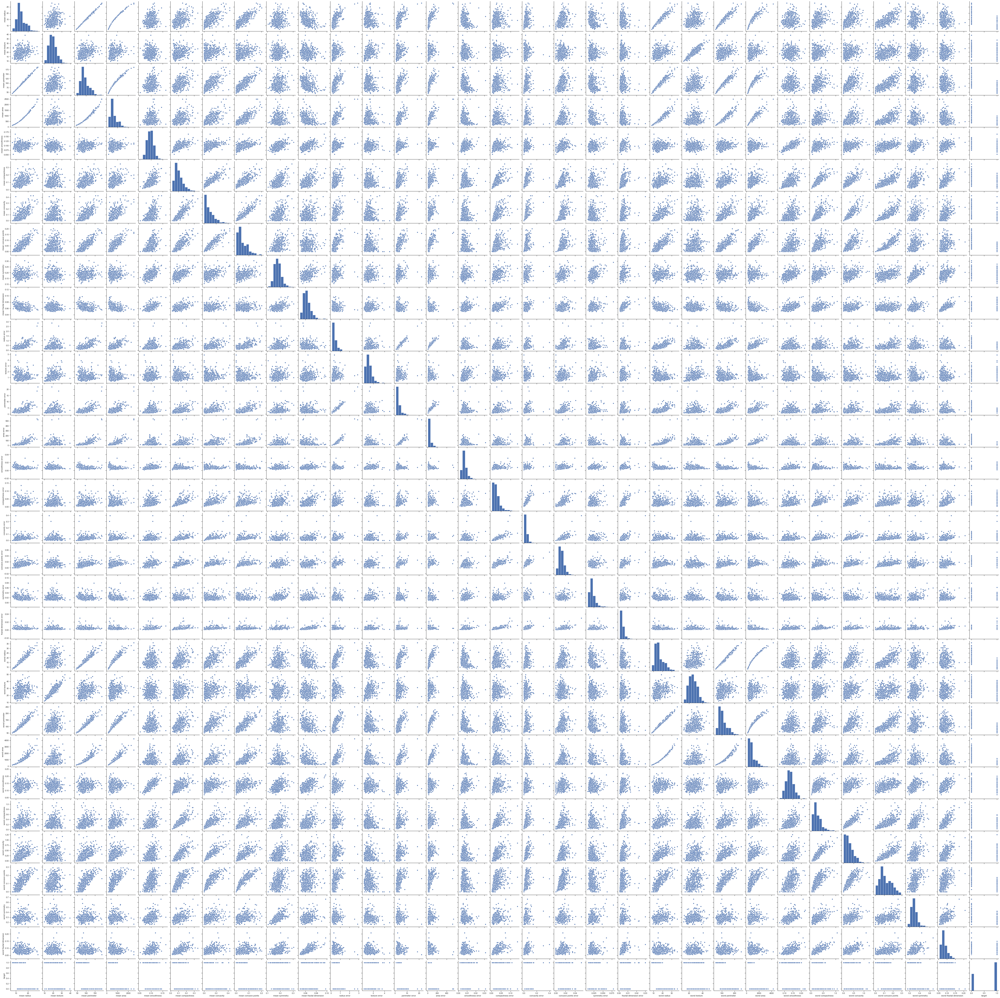

In [28]:
sns.pairplot(temp_df)

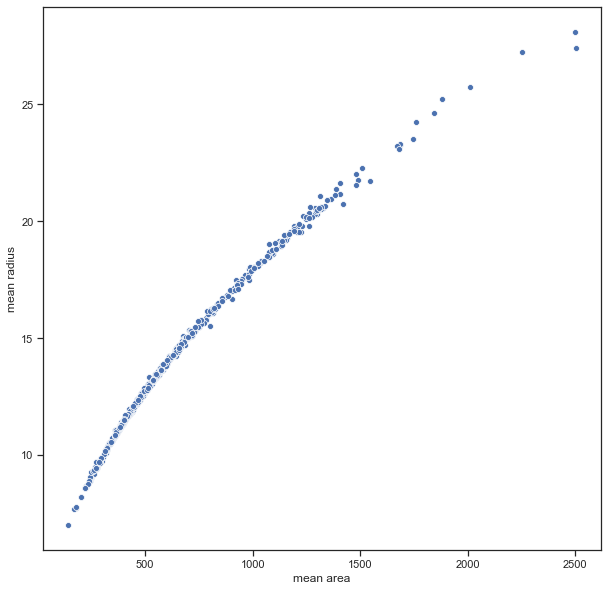

In [29]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.scatterplot(ax=ax, x='mean area', y='mean radius', data=temp_df)

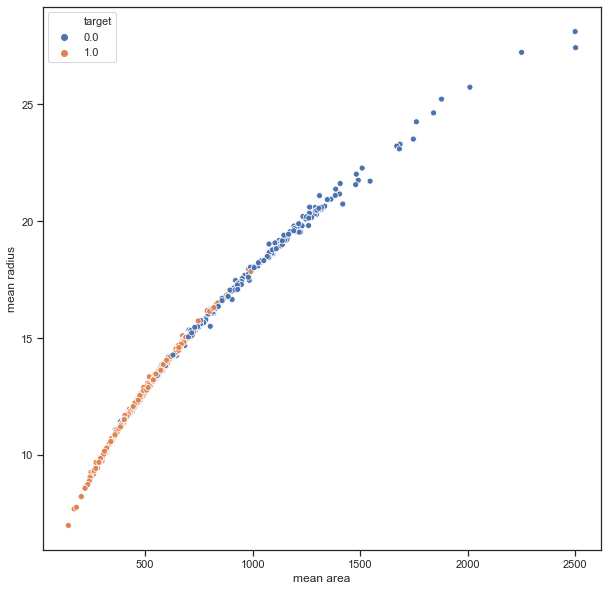

In [31]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.scatterplot(ax=ax, x='mean area', y='mean radius', data=temp_df, hue='target')

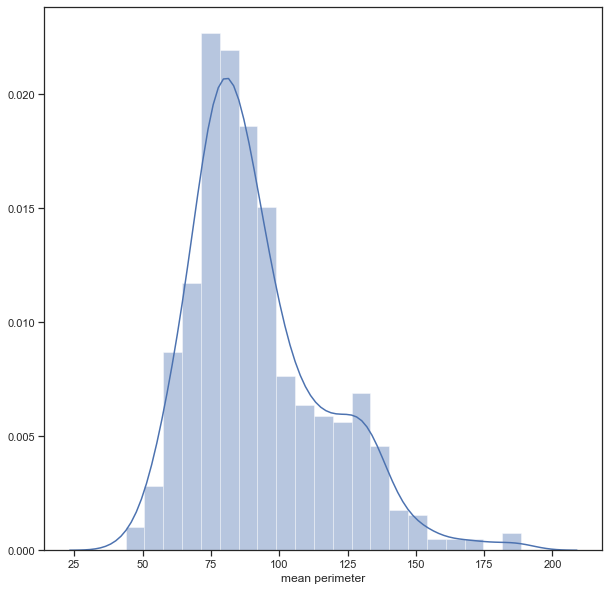

In [32]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.distplot(temp_df['mean perimeter'])

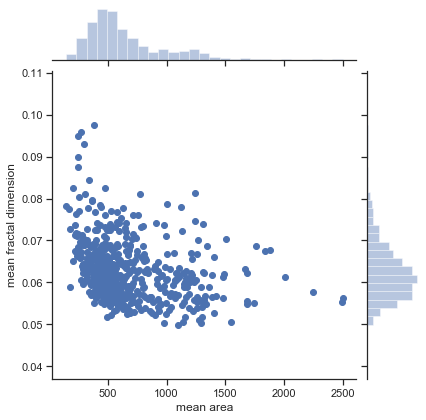

In [33]:
sns.jointplot(x='mean area', y='mean fractal dimension', data=temp_df)

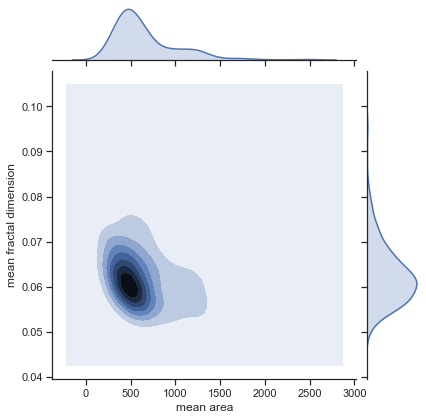

In [36]:
sns.jointplot(x='mean area', y='mean fractal dimension', data=temp_df, kind="kde")

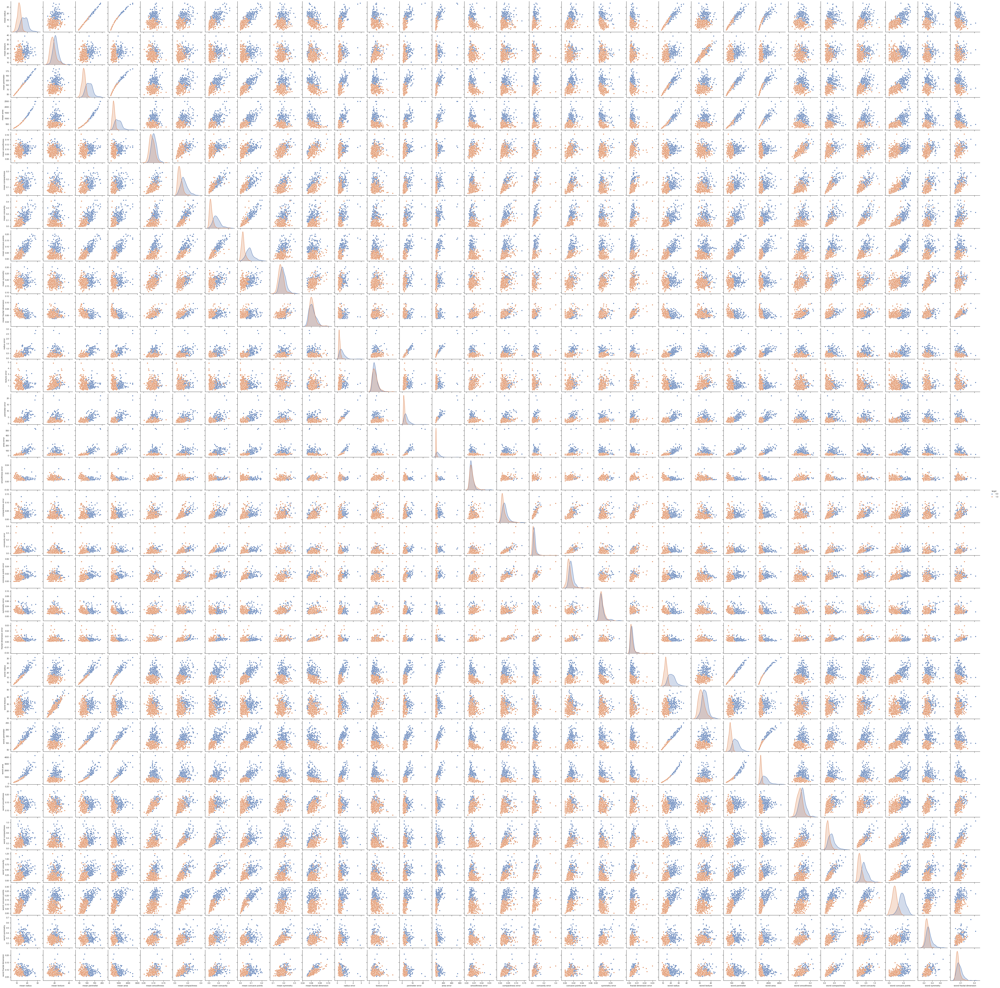

In [38]:

sns.pairplot(temp_df, hue="target")

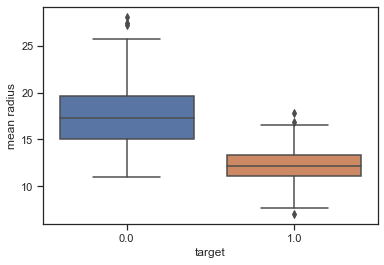

In [39]:
sns.boxplot(x='target', y='mean radius', data=temp_df)

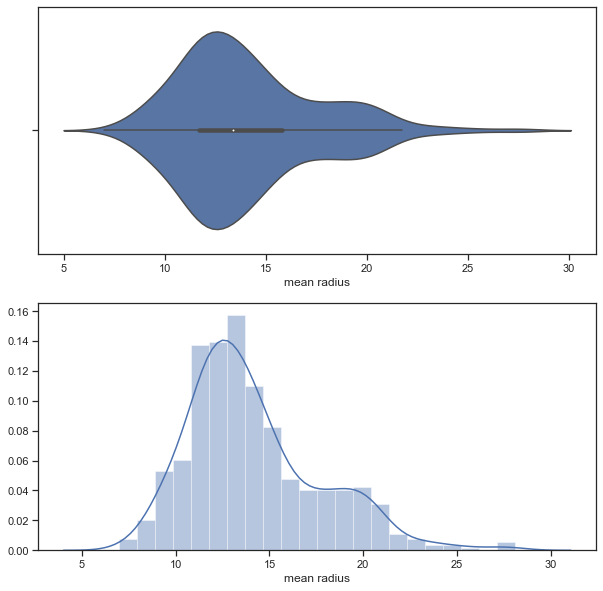

In [44]:

fig, ax = plt.subplots(2, 1, figsize=(10,10))
sns.violinplot(ax=ax[0], x=temp_df['mean radius'])
sns.distplot(temp_df['mean radius'], ax=ax[1])

In [60]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer
from sklearn.tree import DecisionTreeClassifier

In [61]:
X, y =  load_breast_cancer( return_X_y= True) 
X_train,  X_test,  y_train,  y_test =  train_test_split( X,  y,  random_state= 0 ) 

clf =  DecisionTreeClassifier( random_state= 0) 
path =  clf.cost_complexity_pruning_path(X_train,  y_train) 
ccp_alphas,  impurities =  path.ccp_alphas,  path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

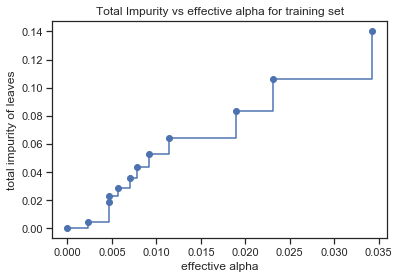

In [63]:
fig,ax =  plt.subplots()
ax.plot(ccp_alphas[: - 1 ],  impurities[:-1 ],  marker= 'o',  drawstyle= "steps-post") 
ax.set_xlabel("effective alpha") 
ax.set_ylabel("total impurity of leaves") 
ax.set_title("Total Impurity vs effective alpha for training set")

In [64]:
clfs =  [] 
for ccp_alpha in ccp_alphas: 
    clf =  DecisionTreeClassifier(random_state= 0 ,  ccp_alpha= ccp_alpha) 
    clf.fit(X_train,  y_train) 
    clfs.append(clf) 
print("Number of nodes in the last tree is: {}  with ccp_alpha: {}" .format(
      clfs[- 1].tree_.node_count,  ccp_alphas[ - 1]))

Number of nodes in the last tree is: 1  with ccp_alpha: 0.3272984419327777


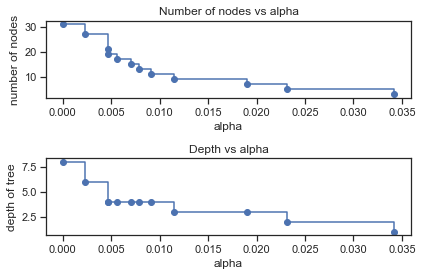

In [66]:
clfs =  clfs[: - 1 ] 
ccp_alphas =  ccp_alphas[: - 1] 

node_counts =  [ clf.tree_.node_count for clf in clfs] 
depth =  [ clf.tree_.max_depth for clf in clfs] 
fig,  ax =  plt.subplots(2 ,  1 ) 
ax[ 0 ] .plot(ccp_alphas,  node_counts,  marker= 'o',  drawstyle= "steps-post") 
ax[ 0 ] .set_xlabel("alpha") 
ax[ 0 ] .set_ylabel("number of nodes") 
ax[ 0 ] .set_title("Number of nodes vs alpha") 
ax[ 1].plot(ccp_alphas,  depth,  marker= 'o',  drawstyle= "steps-post") 
ax[ 1 ] .set_xlabel("alpha") 
ax[ 1 ] .set_ylabel("depth of tree") 
ax[ 1 ] .set_title("Depth vs alpha") 
fig.tight_layout()

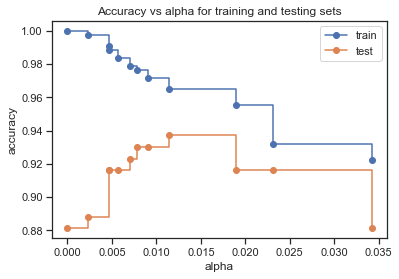

In [67]:
train_scores =  [clf.score(X_train,  y_train)  for clf in clfs] 
test_scores =  [ clf.score(X_test,  y_test)  for clf in clfs] 

fig,  ax =  plt.subplots()
ax.set_xlabel("alpha") 
ax.set_ylabel("accuracy") 
ax.set_title("Accuracy vs alpha for training and testing sets") 
ax.plot(ccp_alphas,  train_scores,  marker= 'o',  label= "train", 
        drawstyle= "steps-post") 
ax.plot(ccp_alphas,  test_scores,  marker= 'o',  label= "test", 
        drawstyle= "steps-post") 
ax.legend() 
plt.show()

# 4. Информация о корреляции признаков

In [69]:
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import spearmanr
from scipy.cluster import hierarchy

from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split

In [70]:
data =  load_breast_cancer() 
X,  y =  data.data,  data.target
X_train,  X_test,  y_train,  y_test =  train_test_split( X,  y,  random_state= 42 ) 

clf =  RandomForestClassifier(n_estimators= 100 ,  random_state= 42 ) 
clf.fit(X_train,  y_train) 
print("Accuracy on test data: {:.2f}".format(clf.score( X_test,  y_test)))

Accuracy on test data: 0.97


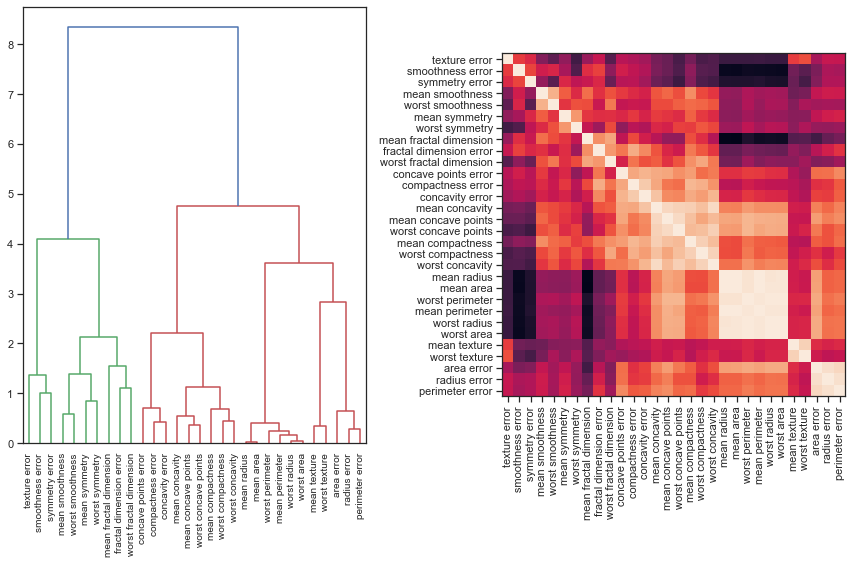

In [96]:
import matplotlib.pyplot as plt
fig, (ax1,  ax2) = plt.subplots(1, 2,  figsize=(12, 8))

corr =  spearmanr( X).correlation
corr_linkage =  hierarchy.ward(corr) 
dendro =  hierarchy.dendrogram( corr_linkage,  labels= data.feature_names,  ax= ax1, 
                              leaf_rotation= 90) 
dendro_idx =  np.arange(0,  len(dendro['ivl'])) 

ax2.imshow(corr[ dendro['leaves'], :] [:,  dendro['leaves']]) 
ax2.set_xticks(dendro_idx) 
ax2.set_yticks(dendro_idx) 
ax2.set_xticklabels(dendro[ 'ivl'],  rotation= 'vertical') 
ax2.set_yticklabels(dendro[ 'ivl']) 
fig.tight_layout()
plt.show()

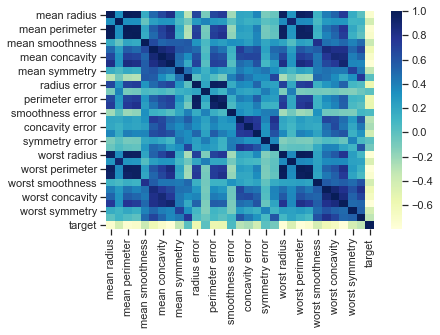

In [99]:
sns.heatmap(temp_df.corr(), cmap='YlGnBu', fmt='.3f')

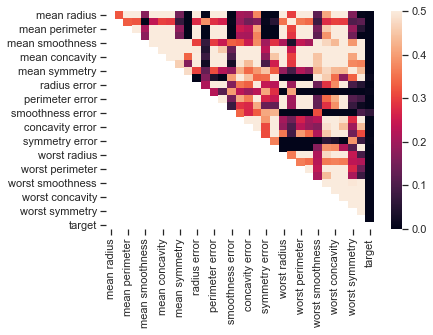

In [101]:
mask = np.zeros_like(temp_df.corr(), dtype=np.bool)
mask[np.tril_indices_from(mask)] = True
sns.heatmap(temp_df.corr(),vmin=0, vmax=0.5, mask=mask, fmt='.3f')

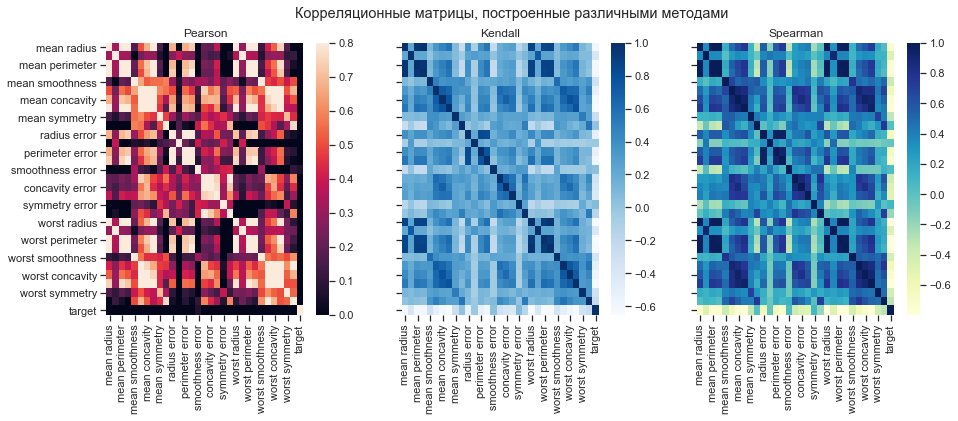

In [115]:
fig, ax = plt.subplots(1, 3, sharex='col', sharey='row', figsize=(15,5))
sns.heatmap(temp_df.corr(method='pearson'), ax=ax[0],vmin=0, vmax=0.8,  fmt='.3f')
sns.heatmap(temp_df.corr(method='kendall'), ax=ax[1], cmap="Blues", fmt='.3f')
sns.heatmap(temp_df.corr(method='spearman'), ax=ax[2], cmap="YlGnBu", fmt='.3f')
fig.suptitle('Корреляционные матрицы, построенные различными методами')
ax[0].title.set_text('Pearson')
ax[1].title.set_text('Kendall')
ax[2].title.set_text('Spearman')